# Chunked DINO incremental → SAM3 point prompts → tracking

Scalable variant of `10_dino_sam_incremental.ipynb`. That single-session driver
OOMs on the full 475-frame / 24-masklet run because the SAM3 session state grows
with objects x frames (`avance.md` §5.4). Here the proxy is split into
`CHUNK_FRAMES`-frame chunks with `OVERLAP_FRAMES` of overlap: every chunk gets a
fresh session (so the session memory is bounded by the chunk length) and every
object alive on the first frame of the overlap is re-prompted in the next chunk
under the SAME global `obj_id` (`carry_over_points`), which is what keeps
identities alive across the session restart.

`plan_chunks` keeps the chunk starts on the global DINO keyframe grid;
`merge_chunk_outputs` writes the chunks from oldest to newest, so each overlapped
frame is rendered from the NEWER chunk's session (a frame the newer chunk never
reached keeps the older chunk's mask instead of becoming a gap), concatenating
into one continuous masklet video + JSON. Session order per
chunk: `start_session` (with the VRAM offload flags) → `add_prompt` (carried
points, then new DINO candidates) → `propagate_in_video` (partial, repeatedly) →
`close_session`. The predictor (model weights) is built once and reused by every
chunk, and the DINO keyframes still come from the ORIGINAL 4K video (the
1024x576 proxy yields zero detections, verified in 10).

Caveats carried over from 10: false positives (glints, waves) still become
tracks; masks backfilled on frames before an object appeared can be spurious; a
dolphin that vanishes exactly on a chunk boundary may split into two ids (the
overlap makes that unlikely and it is visible in the JSON).

In [1]:
# Must be set before the first CUDA allocation: the full run OOMs otherwise.
%env PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

%matplotlib inline
import json

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

from fish_segmentation.dinov3 import load_backbone, run_zoom_detector
from fish_segmentation.ingest import process_video
from fish_segmentation.paths import find_repo_root, load_env
from fish_segmentation.sam3_utils import plan_chunks
from fish_segmentation.video_io import load_all_frames_rgb, load_frame_rgb

load_env()
ROOT = find_repo_root()

device = "cuda" if torch.cuda.is_available() else "cpu"
SESSION_FPS = 15        # proxy/session frame rate (DINO keyframes are mapped by time)
DINO_LONG_SIDE = 1024
DINO_RESOLUTION_SCALE = 4.0   # tuned on 4K originals (DINO runs on original frames)
ZONE_MERGE_GAP = 0.08
MIN_ZONE_FRACTION = 0.25
MIN_CONFIRMATIONS = 2   # keep only detections confirmed at >= 2 zoom levels
KEYFRAME_STRIDE = 30    # run DINO every 30 frames (2 s at 15 fps)
MAX_OBJECTS = 24        # global cap on tracked masklets (carried objects included)
MIN_SCORE = 0.5         # quality filters for new candidates (None disables one)
MIN_SOLIDITY = 0.25
MIN_AREA = None         # 'area' is in view pixels, not comparable across levels
MASK_MARGIN_PX = 4      # reject points this close to an already-tracked mask
DEDUPE_OVERLAP = 0.3    # bbox IoU above which two candidates are duplicates

# Chunked execution: 150 frames bound the per-session objects x frames state,
# 30 frames (2 s) of overlap carry the objects into the next session.
CHUNK_FRAMES = 150
OVERLAP_FRAMES = 30
CARRY_MIN_AREA = 16     # skip carried masks smaller than this (session pixels)
SHOW_KEYFRAME_REVIEW = True
print(device)

env: PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True


cuda


## 1. Chunk plan and chunk proxies

`plan_chunks(n_frames, CHUNK_FRAMES, OVERLAP_FRAMES, align=KEYFRAME_STRIDE)`
returns the half-open `(start, end)` ranges: consecutive chunks advance
`CHUNK_FRAMES - OVERLAP_FRAMES` frames and the advance is aligned to the DINO
keyframe stride, so every chunk runs DINO on the same global grid (frame
`start + k` with `k` a multiple of 30). Each chunk proxy is cut from the
1024x576 session proxy with `process_video(start_time=..., duration=...)`; the
frame count is asserted so local `k` maps to global `start + k` exactly.

In [2]:
video_path = ROOT / "dataset" / "processed" / "20260813_213529_7f994a2f" / "video.mp4"
if not video_path.exists():
    video_path = ROOT / "data" / "test_media" / "dolphin_00.mp4"
print(f"Using video: {video_path}")

OUTPUTS = ROOT / "notebooks" / "outputs"
CHUNK_DIR = OUTPUTS / "chunks"
CHUNK_DIR.mkdir(parents=True, exist_ok=True)
stem = f"{video_path.parent.name}_{video_path.stem}"

sam3_video_path = OUTPUTS / f"{stem}_1024x576.mp4"
if not sam3_video_path.exists():
    process_video(
        input_path=str(video_path),
        output_path=str(sam3_video_path),
        target_width=1024,
        target_height=576,
        fps=SESSION_FPS,
    )

cap = cv2.VideoCapture(str(video_path))
orig_fps = cap.get(cv2.CAP_PROP_FPS) or SESSION_FPS
orig_n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
cap.release()

cap = cv2.VideoCapture(str(sam3_video_path))
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
cap.release()

chunk_plan = plan_chunks(n_frames, CHUNK_FRAMES, OVERLAP_FRAMES, align=KEYFRAME_STRIDE)
print(
    f"Original: {orig_n_frames} frames @ {orig_fps:.2f} fps | "
    f"session: {n_frames} frames @ {SESSION_FPS} fps"
)
print(f"chunks ({CHUNK_FRAMES} frames, {OVERLAP_FRAMES} overlap): {chunk_plan}")

chunk_paths = []
for index, (start, end) in enumerate(chunk_plan):
    chunk_path = CHUNK_DIR / f"{stem}_c{index}_{start}_{end}.mp4"
    if not chunk_path.exists():
        process_video(
            input_path=str(sam3_video_path),
            output_path=str(chunk_path),
            target_width=1024,
            target_height=576,
            start_time=start / SESSION_FPS,
            duration=(end - start) / SESSION_FPS,
            fps=SESSION_FPS,
        )
    cap = cv2.VideoCapture(str(chunk_path))
    chunk_len = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    cap.release()
    assert chunk_len == end - start, f"chunk {index}: {chunk_len} frames, expected {end - start}"
    chunk_paths.append(chunk_path)
print(f"{len(chunk_paths)} chunk proxies ready in {CHUNK_DIR.relative_to(ROOT)}")

Using video: /workspace/fish-segmentation/dataset/processed/20260813_213529_7f994a2f/video.mp4


Original: 475 frames @ 15.00 fps | session: 475 frames @ 15 fps
chunks (150 frames, 30 overlap): [(0, 150), (120, 270), (240, 390), (360, 475)]


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

[libx264 @ 0x5e9105d14780] using cpu capabilities: MMX2 SSE2Fast SSSE3 SSE4.2 AVX FMA3 BMI2 AVX2
[libx264 @ 0x5e9105d14780] profile High, level 3.1, 4:2:0, 8-bit
[libx264 @ 0x5e9105d14780] 264 - core 164 r3108 31e19f9 - H.264/MPEG-4 AVC codec - Copyleft 2003-2023 - http://www.videolan.org/x264.html - options: cabac=1 ref=3 deblock=1:0:0 analyse=0x3:0x113 me=hex subme=7 psy=1 psy_rd=1.00:0.00 mixed_ref=1 me_range=16 chroma_me=1 trellis=1 8x8dct=1 cqm=0 deadzone=21,11 fast_pskip=1 chroma_qp_offset=-2 threads=18 lookahead_threads=3 sliced_threads=0 nr=0 decimate=1 interlaced=0 bluray_compat=0 constrained_intra=0 bframes=3 b_pyramid=2 b_adapt=1 b_bias=0 direct=1 weightb=1 open_gop=0 weightp=2 keyint=250 keyint_min=15 scenecut=40 intra_refresh=0 rc_lookahead=40 rc=crf mbtree=1 crf=18.0 qcomp=0.60 qpmin=0 qpmax=69 qpstep=4 ip_ratio=1.40 aq=1:1.00
Output #0, mp4, to '/workspace/fish-segmentation/notebooks/outputs/chunks/20260813_213529_7f994a2f_video_c2_240_390.mp4':
  Metadata:
    major_bra

[out#0/mp4 @ 0x5e9105d13640] video:1814kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.145419%
frame=  150 fps= 96 q=-1.0 Lsize=    1816kB time=00:00:09.80 bitrate=1518.4kbits/s speed=6.28x    
[libx264 @ 0x5e9105d14780] frame I:4     Avg QP:10.66  size: 32292
[libx264 @ 0x5e9105d14780] frame P:39    Avg QP:13.15  size: 17515
[libx264 @ 0x5e9105d14780] frame B:107   Avg QP:13.78  size:  9761
[libx264 @ 0x5e9105d14780] consecutive B-frames:  4.0%  2.7%  0.0% 93.3%
[libx264 @ 0x5e9105d14780] mb I  I16..4: 12.1% 73.5% 14.4%
[libx264 @ 0x5e9105d14780] mb P  I16..4:  6.3% 19.8%  3.2%  P16..4: 40.0% 22.5%  7.4%  0.0%  0.0%    skip: 0.9%
[libx264 @ 0x5e9105d14780] mb B  I16..4:  0.7%  0.9%  0.1%  B16..8: 48.5% 13.5%  1.6%  direct:18.3%  skip:16.5%  L0:52.4% L1:41.8% BI: 5.8%
[libx264 @ 0x5e9105d14780] 8x8 transform intra:67.6% inter:75.8%
[libx264 @ 0x5e9105d14780] coded y,uvDC,uvAC intra: 48.8% 94.8% 77.2% inter: 25.6% 65.9% 15.9%
[libx264 @ 0x5e9105d14780] 

[libx264 @ 0x55a41e0c9780] using cpu capabilities: MMX2 SSE2Fast SSSE3 SSE4.2 AVX FMA3 BMI2 AVX2
[libx264 @ 0x55a41e0c9780] profile High, level 3.1, 4:2:0, 8-bit
[libx264 @ 0x55a41e0c9780] 264 - core 164 r3108 31e19f9 - H.264/MPEG-4 AVC codec - Copyleft 2003-2023 - http://www.videolan.org/x264.html - options: cabac=1 ref=3 deblock=1:0:0 analyse=0x3:0x113 me=hex subme=7 psy=1 psy_rd=1.00:0.00 mixed_ref=1 me_range=16 chroma_me=1 trellis=1 8x8dct=1 cqm=0 deadzone=21,11 fast_pskip=1 chroma_qp_offset=-2 threads=18 lookahead_threads=3 sliced_threads=0 nr=0 decimate=1 interlaced=0 bluray_compat=0 constrained_intra=0 bframes=3 b_pyramid=2 b_adapt=1 b_bias=0 direct=1 weightb=1 open_gop=0 weightp=2 keyint=250 keyint_min=15 scenecut=40 intra_refresh=0 rc_lookahead=40 rc=crf mbtree=1 crf=18.0 qcomp=0.60 qpmin=0 qpmax=69 qpstep=4 ip_ratio=1.40 aq=1:1.00
Output #0, mp4, to '/workspace/fish-segmentation/notebooks/outputs/chunks/20260813_213529_7f994a2f_video_c3_360_475.mp4':
  Metadata:
    major_bra

4 chunk proxies ready in notebooks/outputs/chunks


[out#0/mp4 @ 0x55a41e0c8640] video:1388kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.158741%
frame=  115 fps=102 q=-1.0 Lsize=    1391kB time=00:00:07.46 bitrate=1525.8kbits/s speed=6.61x    
[libx264 @ 0x55a41e0c9780] frame I:2     Avg QP:11.88  size: 26668
[libx264 @ 0x55a41e0c9780] frame P:30    Avg QP:13.24  size: 16877
[libx264 @ 0x55a41e0c9780] frame B:83    Avg QP:13.73  size: 10379
[libx264 @ 0x55a41e0c9780] consecutive B-frames:  3.5%  0.0%  2.6% 93.9%
[libx264 @ 0x55a41e0c9780] mb I  I16..4: 12.3% 74.4% 13.2%
[libx264 @ 0x55a41e0c9780] mb P  I16..4:  7.0% 20.5%  3.2%  P16..4: 37.5% 22.2%  8.4%  0.0%  0.0%    skip: 1.1%
[libx264 @ 0x55a41e0c9780] mb B  I16..4:  1.0%  1.2%  0.1%  B16..8: 47.2% 14.0%  1.8%  direct:22.5%  skip:12.2%  L0:59.4% L1:36.0% BI: 4.6%
[libx264 @ 0x55a41e0c9780] 8x8 transform intra:65.8% inter:76.8%
[libx264 @ 0x55a41e0c9780] coded y,uvDC,uvAC intra: 43.6% 93.8% 73.2% inter: 29.4% 72.0% 16.9%
[libx264 @ 0x55a41e0c9780] 

In [3]:
model, processor = load_backbone("facebook/dinov3-vitl16-pretrain-lvd1689m", device=device)

Loading weights:   0%|          | 0/415 [00:00<?, ?it/s]

## 2. Chunk loop

Per chunk: open a session, carry the objects alive in the previous chunk into it
as point prompts on the FIRST frame of the overlap (same global `obj_id`, mask
interior point), then run the incremental DINO loop with global keyframes. At
`k=0` the carried prompts make `select_new_points` reject detections that are
already covered, so a dolphin is never re-prompted as a second id. Each chunk
propagates at least once (forward from `k=0`), so it always covers its whole
range; `close_session` + `empty_cache` release the session state before the next
chunk.

/workspace/fish-segmentation/sam3_src/sam3/model_builder.py:8: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


/workspace/fish-segmentation/.venv/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


INFO 2026-09-21 01:09:57,555 13896 sam3_video_predictor.py: 120: using the following GPU IDs: [0]


INFO 2026-09-21 01:09:57,557 13896 sam3_video_predictor.py: 136: 


	*** START loading model on all ranks ***




INFO 2026-09-21 01:09:57,557 13896 sam3_video_predictor.py: 138: loading model on rank=0 with world_size=1 -- this could take a while ...


INFO 2026-09-21 01:10:06,515 13896 sam3_video_base.py: 354: setting max_num_objects=10000 and num_obj_for_compile=16


INFO 2026-09-21 01:10:15,260 13896 sam3_video_predictor.py: 140: loading model on rank=0 with world_size=1 -- DONE locally


INFO 2026-09-21 01:10:15,261 13896 sam3_video_predictor.py: 151: 


	*** DONE loading model on all ranks ***




frame loading (OpenCV) [rank=0]:   0%|          | 0/150 [00:00<?, ?it/s]

frame loading (OpenCV) [rank=0]:   1%|          | 1/150 [00:00<00:19,  7.79it/s]

frame loading (OpenCV) [rank=0]:  44%|████▍     | 66/150 [00:00<00:00, 345.96it/s]

frame loading (OpenCV) [rank=0]:  89%|████████▉ | 134/150 [00:00<00:00, 487.53it/s]

frame loading (OpenCV) [rank=0]: 100%|██████████| 150/150 [00:00<00:00, 426.83it/s]

INFO 2026-09-21 01:10:16,254 13896 sam3_base_predictor.py: 146: started new session 4aceb066-43d4-4446-89b1-5d26e362d065


  0%|          | 0/150 [00:00<?, ?it/s]

INFO 2026-09-21 01:10:52,127 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


c0 k=   0 (global    0):  5 DINO candidates,  5 new,  5 prompted,  5 masklets, 150/150 frames | VRAM  8.64 GiB alloc, 13.62 GiB free


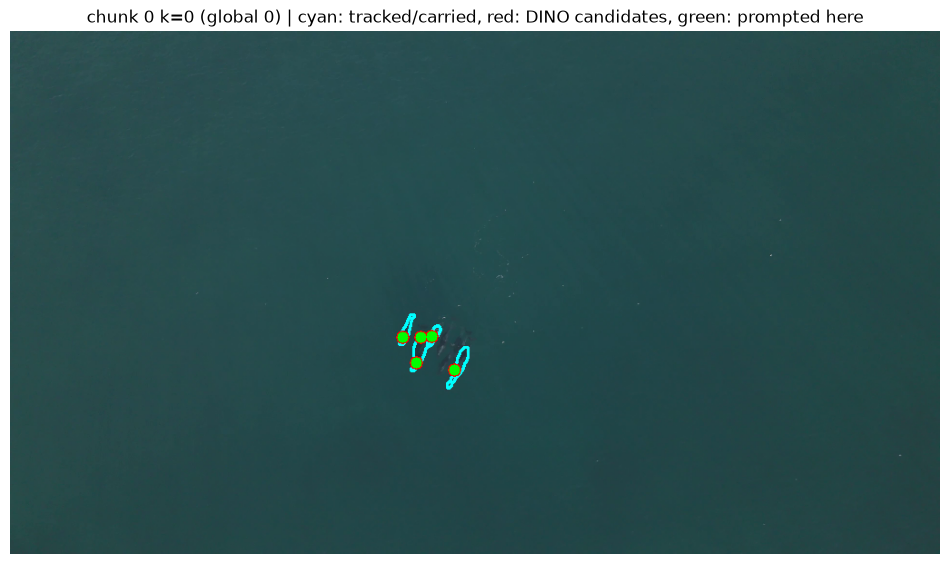

  0%|          | 0/30 [00:00<?, ?it/s]

INFO 2026-09-21 01:10:59,819 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


  0%|          | 0/120 [00:00<?, ?it/s]

INFO 2026-09-21 01:11:13,167 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


c0 k=  30 (global   30):  4 DINO candidates,  1 new,  1 prompted,  6 masklets, 150/150 frames | VRAM  8.87 GiB alloc, 13.24 GiB free


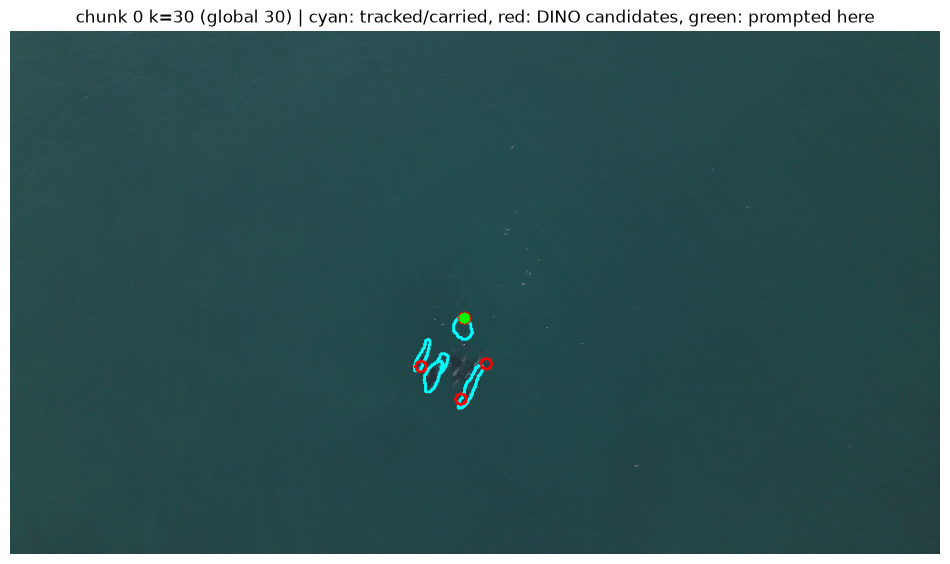

  0%|          | 0/60 [00:00<?, ?it/s]

INFO 2026-09-21 01:11:29,191 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


  0%|          | 0/90 [00:00<?, ?it/s]

INFO 2026-09-21 01:11:45,405 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


c0 k=  60 (global   60):  7 DINO candidates,  5 new,  5 prompted, 11 masklets, 150/150 frames | VRAM  9.28 GiB alloc, 12.71 GiB free


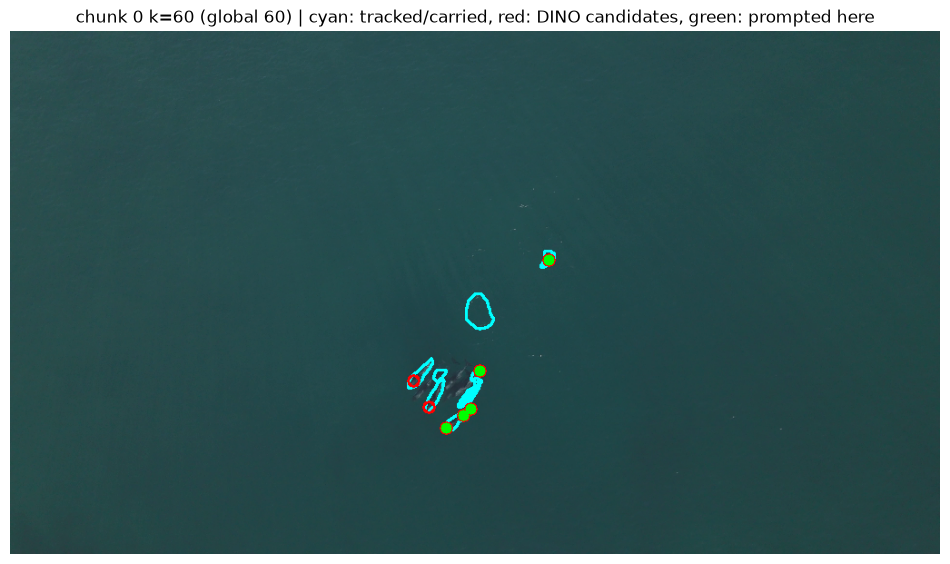

  0%|          | 0/90 [00:00<?, ?it/s]

INFO 2026-09-21 01:11:59,816 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


  0%|          | 0/60 [00:00<?, ?it/s]

INFO 2026-09-21 01:12:06,177 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


c0 k=  90 (global   90):  5 DINO candidates,  1 new,  1 prompted, 12 masklets, 150/150 frames | VRAM  9.37 GiB alloc, 12.62 GiB free


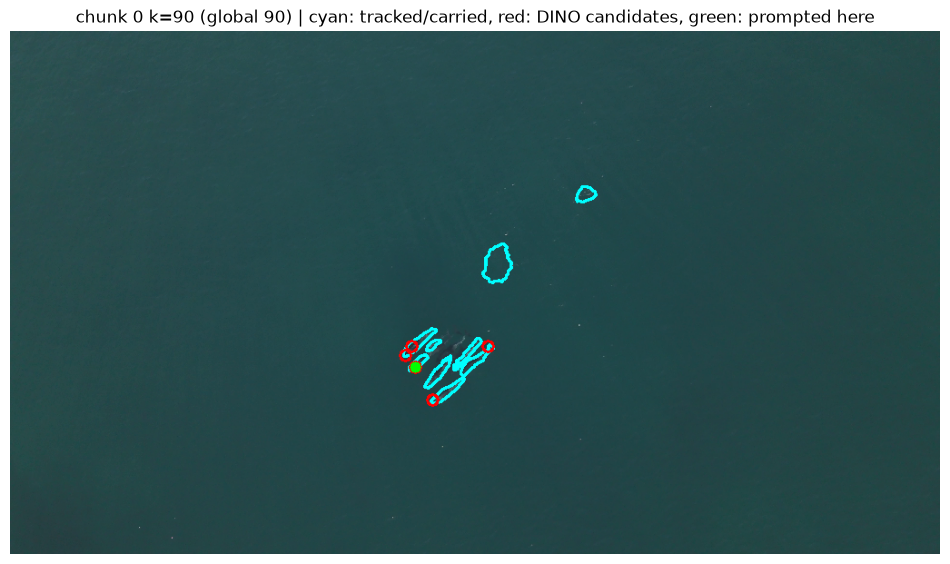

  0%|          | 0/120 [00:00<?, ?it/s]

INFO 2026-09-21 01:12:26,636 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


  0%|          | 0/30 [00:00<?, ?it/s]

INFO 2026-09-21 01:12:30,184 13896 sam3_base_predictor.py: 305: propagation ended in session 4aceb066-43d4-4446-89b1-5d26e362d065


c0 k= 120 (global  120):  4 DINO candidates,  2 new,  2 prompted, 14 masklets, 150/150 frames | VRAM  9.53 GiB alloc, 12.43 GiB free


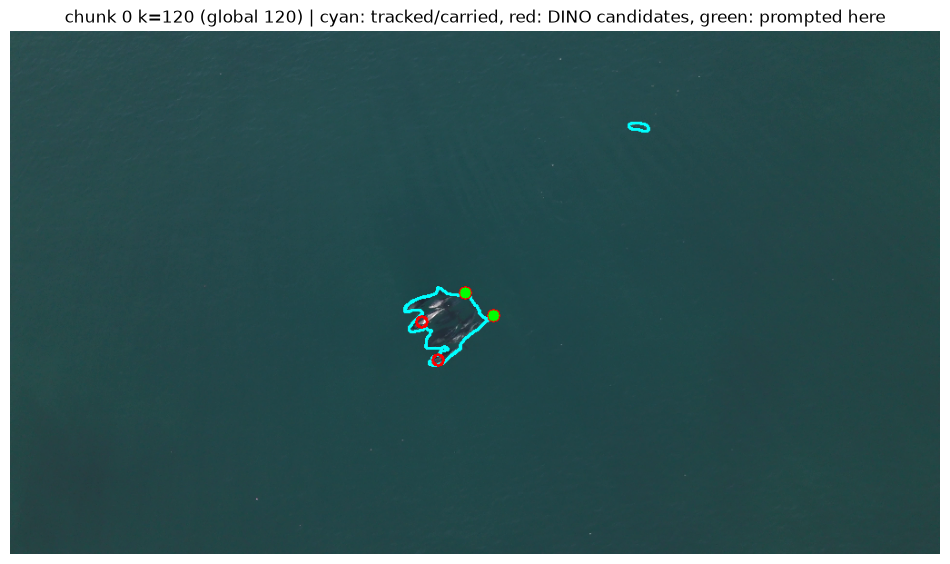

chunk 0 done: 0 carried, 150/150 frames covered, 14 masklets


INFO 2026-09-21 01:12:30,865 13896 sam3_base_predictor.py: 409: removed session 4aceb066-43d4-4446-89b1-5d26e362d065


frame loading (OpenCV) [rank=0]:   0%|          | 0/150 [00:00<?, ?it/s]

frame loading (OpenCV) [rank=0]:  41%|████▏     | 62/150 [00:00<00:00, 615.17it/s]

frame loading (OpenCV) [rank=0]:  85%|████████▍ | 127/150 [00:00<00:00, 634.00it/s]

frame loading (OpenCV) [rank=0]: 100%|██████████| 150/150 [00:00<00:00, 593.38it/s]

INFO 2026-09-21 01:12:31,929 13896 sam3_base_predictor.py: 146: started new session 430f991b-7d75-42de-baae-f487292c92ee


  0%|          | 0/150 [00:00<?, ?it/s]

INFO 2026-09-21 01:13:04,256 13896 sam3_base_predictor.py: 305: propagation ended in session 430f991b-7d75-42de-baae-f487292c92ee


c1 k=   0 (global  120):  4 DINO candidates,  1 new,  1 prompted, 15 masklets, 150/150 frames | VRAM  8.72 GiB alloc, 13.53 GiB free


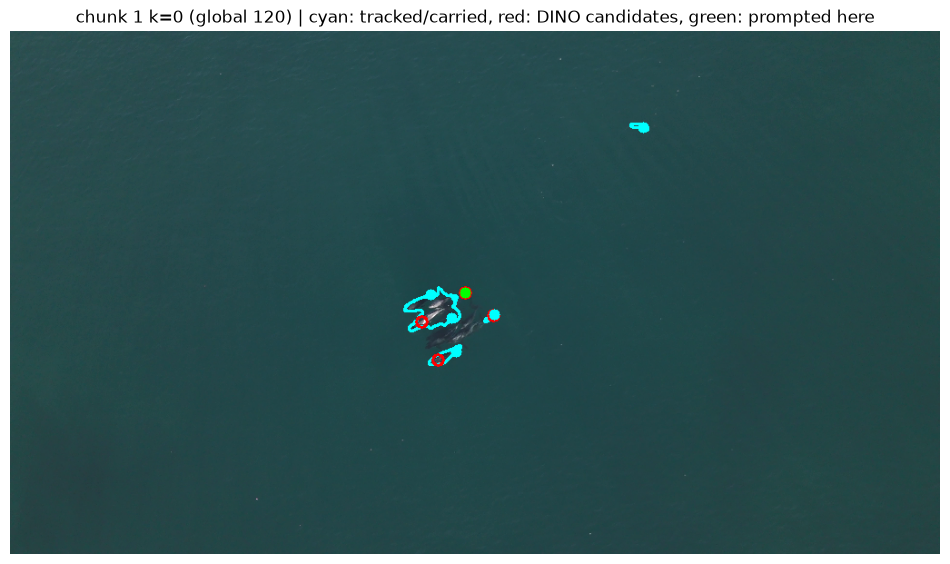

c1 k=  30 (global  150):  4 DINO candidates,  0 new,  0 prompted, 15 masklets, 150/150 frames | VRAM  8.72 GiB alloc, 13.53 GiB free


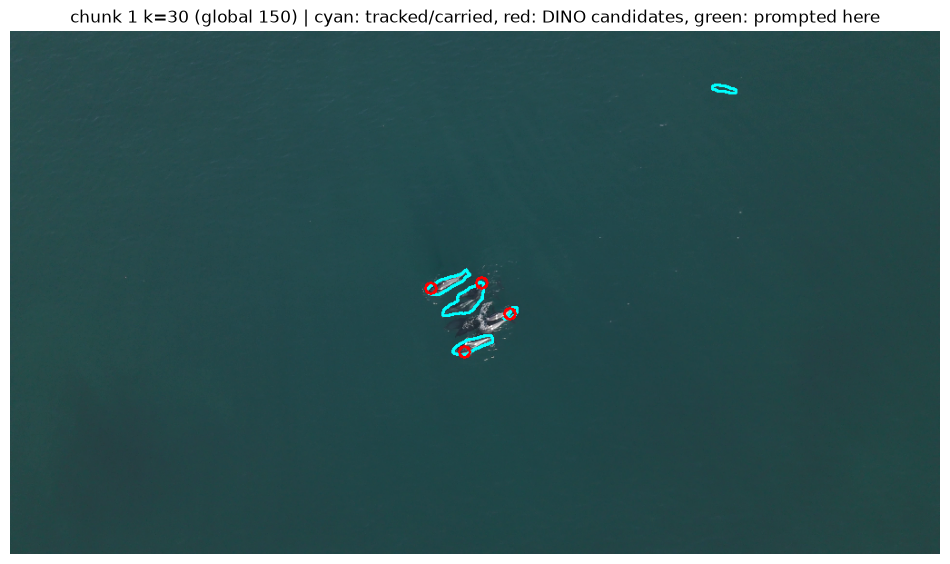

c1 k=  60 (global  180):  3 DINO candidates,  0 new,  0 prompted, 15 masklets, 150/150 frames | VRAM  8.72 GiB alloc, 13.53 GiB free


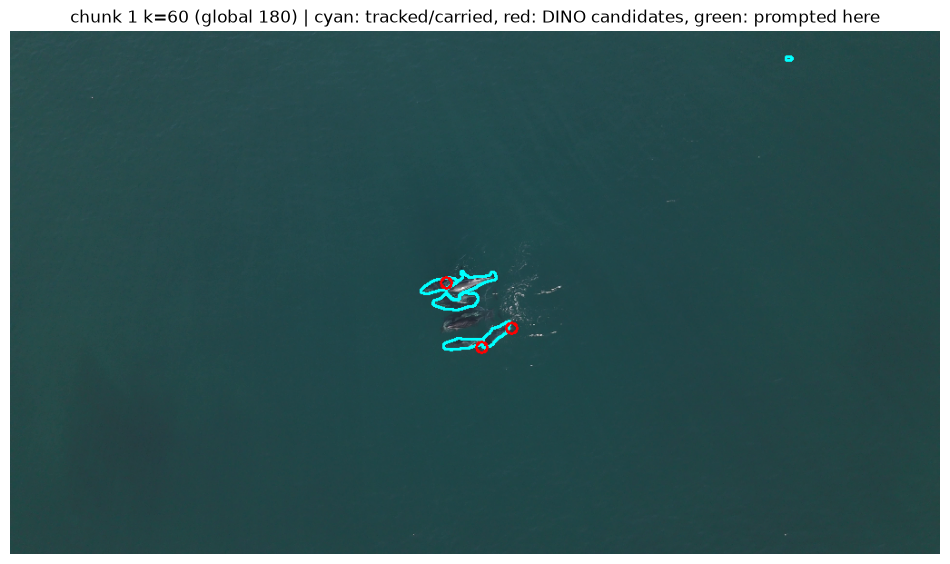

  0%|          | 0/90 [00:00<?, ?it/s]

INFO 2026-09-21 01:13:31,203 13896 sam3_base_predictor.py: 305: propagation ended in session 430f991b-7d75-42de-baae-f487292c92ee


  0%|          | 0/60 [00:00<?, ?it/s]

INFO 2026-09-21 01:13:39,162 13896 sam3_base_predictor.py: 305: propagation ended in session 430f991b-7d75-42de-baae-f487292c92ee


c1 k=  90 (global  210):  9 DINO candidates,  3 new,  3 prompted, 18 masklets, 150/150 frames | VRAM  9.12 GiB alloc, 12.98 GiB free


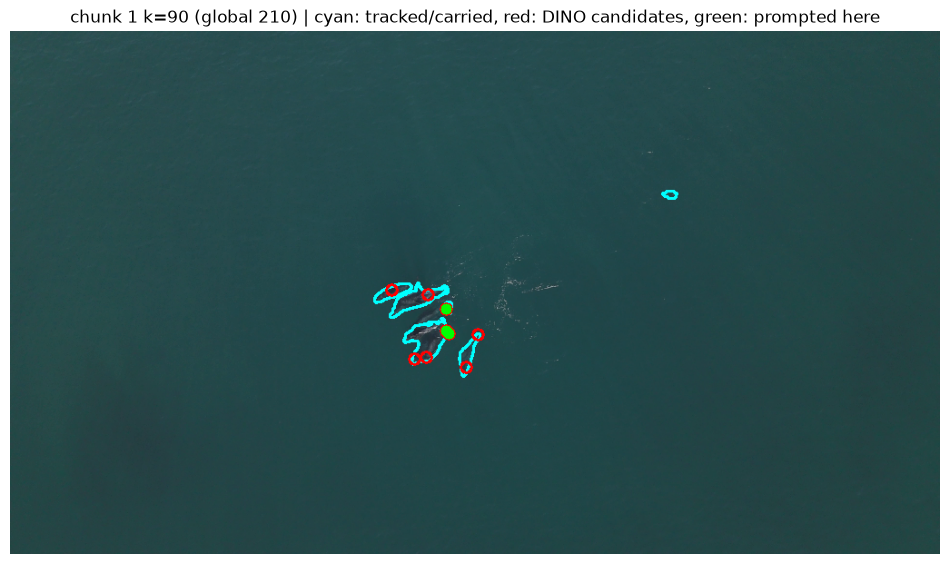

c1 k= 120 (global  240):  3 DINO candidates,  0 new,  0 prompted, 18 masklets, 150/150 frames | VRAM  9.12 GiB alloc, 12.98 GiB free


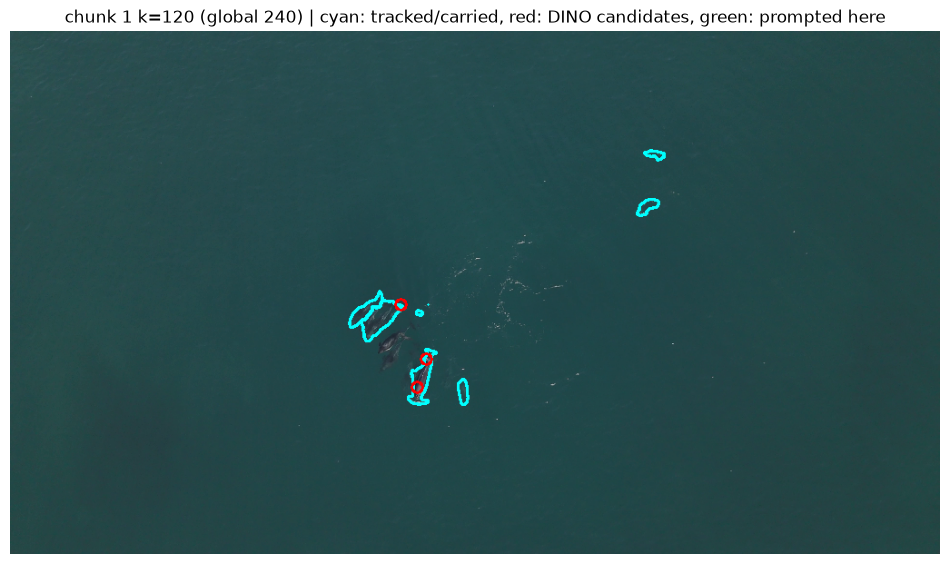

chunk 1 done: 5 carried, 150/150 frames covered, 18 masklets


INFO 2026-09-21 01:13:44,653 13896 sam3_base_predictor.py: 409: removed session 430f991b-7d75-42de-baae-f487292c92ee


frame loading (OpenCV) [rank=0]:   0%|          | 0/150 [00:00<?, ?it/s]

frame loading (OpenCV) [rank=0]:  46%|████▌     | 69/150 [00:00<00:00, 689.05it/s]

frame loading (OpenCV) [rank=0]:  92%|█████████▏| 138/150 [00:00<00:00, 658.31it/s]

frame loading (OpenCV) [rank=0]: 100%|██████████| 150/150 [00:00<00:00, 649.23it/s]

INFO 2026-09-21 01:13:45,691 13896 sam3_base_predictor.py: 146: started new session f3b27555-d3c5-4828-a93d-2755289d7b8b


  0%|          | 0/150 [00:00<?, ?it/s]

INFO 2026-09-21 01:14:20,136 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


c2 k=   0 (global  240):  3 DINO candidates,  0 new,  0 prompted, 18 masklets, 150/150 frames | VRAM  8.81 GiB alloc, 13.45 GiB free


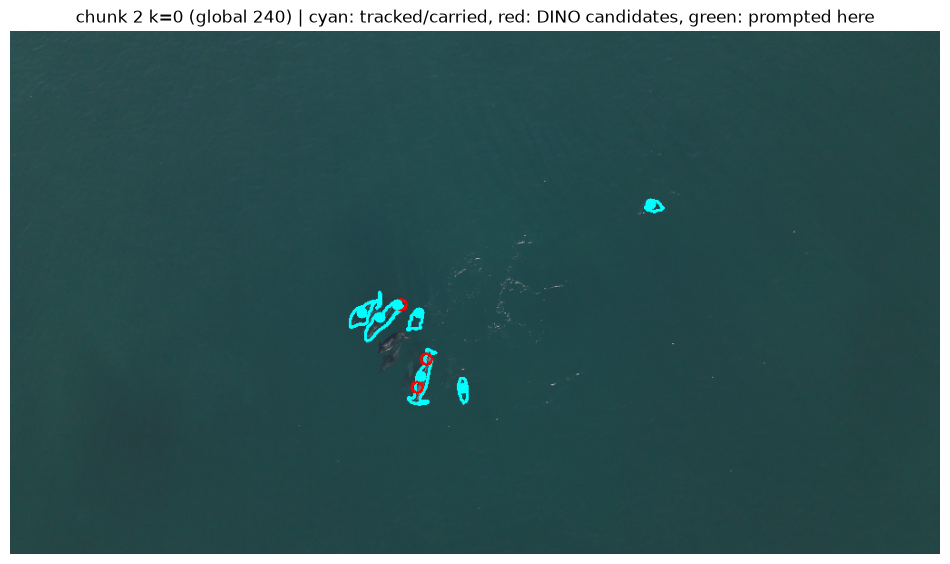

  0%|          | 0/30 [00:00<?, ?it/s]

INFO 2026-09-21 01:14:29,570 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


  0%|          | 0/120 [00:00<?, ?it/s]

INFO 2026-09-21 01:14:45,036 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


c2 k=  30 (global  270):  6 DINO candidates,  2 new,  2 prompted, 20 masklets, 150/150 frames | VRAM  9.12 GiB alloc, 12.97 GiB free


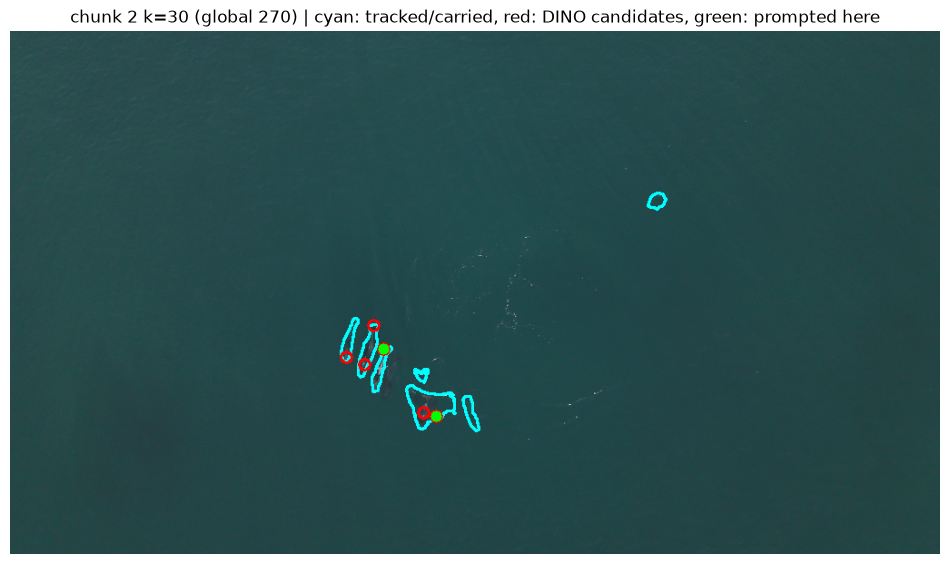

  0%|          | 0/60 [00:00<?, ?it/s]

INFO 2026-09-21 01:14:58,364 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


  0%|          | 0/90 [00:00<?, ?it/s]

INFO 2026-09-21 01:15:09,480 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


c2 k=  60 (global  300):  8 DINO candidates,  2 new,  2 prompted, 22 masklets, 150/150 frames | VRAM  9.28 GiB alloc, 12.68 GiB free


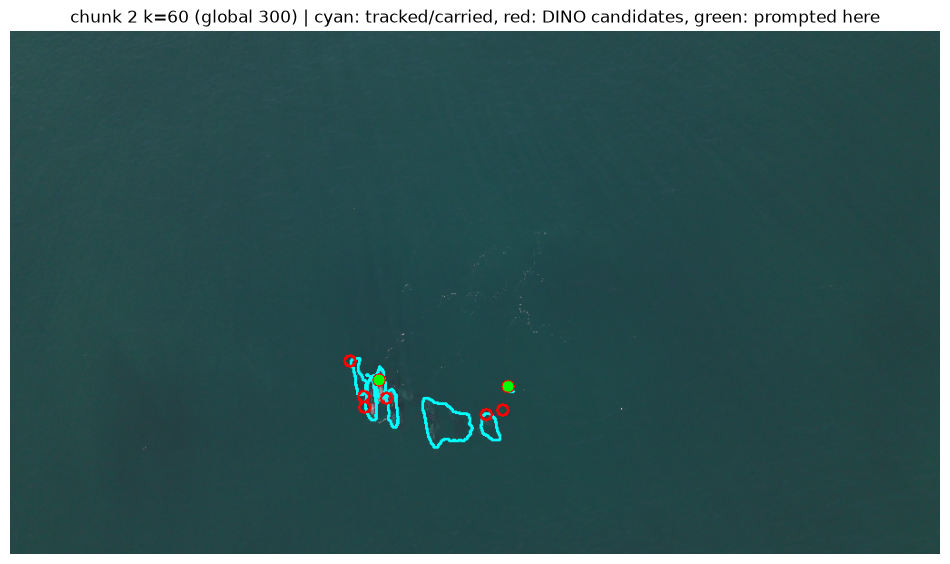

c2 k=  90 (global  330):  5 DINO candidates,  0 new,  0 prompted, 22 masklets, 150/150 frames | VRAM  9.28 GiB alloc, 12.68 GiB free


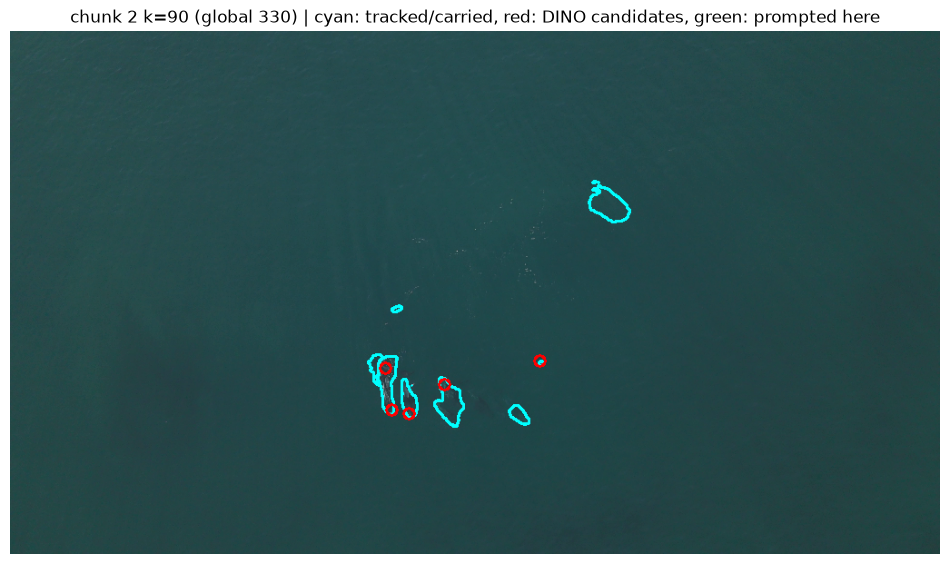

  0%|          | 0/120 [00:00<?, ?it/s]

INFO 2026-09-21 01:15:34,959 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


  0%|          | 0/30 [00:00<?, ?it/s]

INFO 2026-09-21 01:15:38,031 13896 sam3_base_predictor.py: 305: propagation ended in session f3b27555-d3c5-4828-a93d-2755289d7b8b


c2 k= 120 (global  360):  8 DINO candidates,  1 new,  1 prompted, 23 masklets, 150/150 frames | VRAM  9.37 GiB alloc, 12.60 GiB free


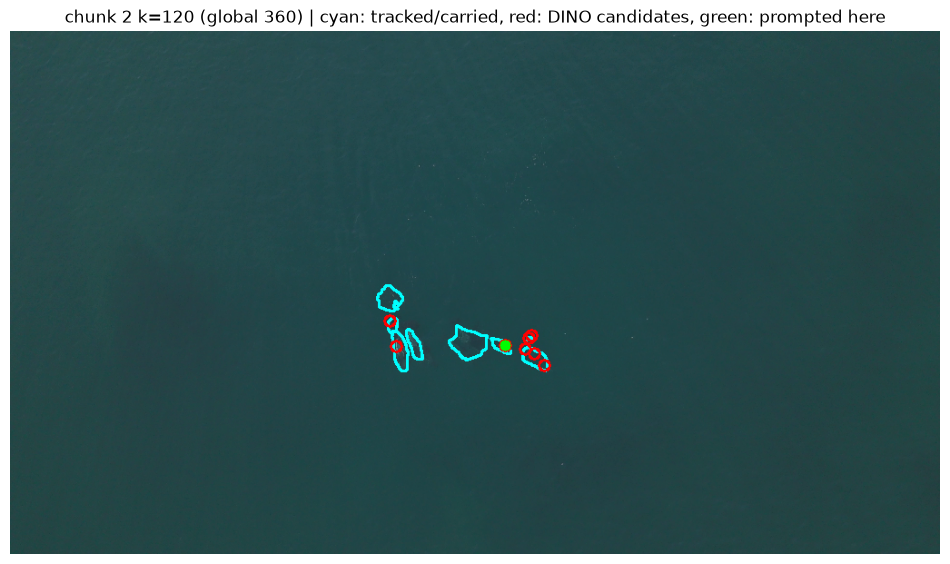

chunk 2 done: 7 carried, 150/150 frames covered, 23 masklets


INFO 2026-09-21 01:15:38,726 13896 sam3_base_predictor.py: 409: removed session f3b27555-d3c5-4828-a93d-2755289d7b8b


frame loading (OpenCV) [rank=0]:   0%|          | 0/115 [00:00<?, ?it/s]

frame loading (OpenCV) [rank=0]:  51%|█████▏    | 59/115 [00:00<00:00, 584.88it/s]

frame loading (OpenCV) [rank=0]: 100%|██████████| 115/115 [00:00<00:00, 603.34it/s]

INFO 2026-09-21 01:15:39,530 13896 sam3_base_predictor.py: 146: started new session 67e93869-d62e-4998-a343-e5a5e3b5be90


  0%|          | 0/115 [00:00<?, ?it/s]

INFO 2026-09-21 01:16:09,939 13896 sam3_base_predictor.py: 305: propagation ended in session 67e93869-d62e-4998-a343-e5a5e3b5be90


c3 k=   0 (global  360):  8 DINO candidates,  0 new,  0 prompted, 23 masklets, 115/115 frames | VRAM  8.34 GiB alloc, 13.91 GiB free


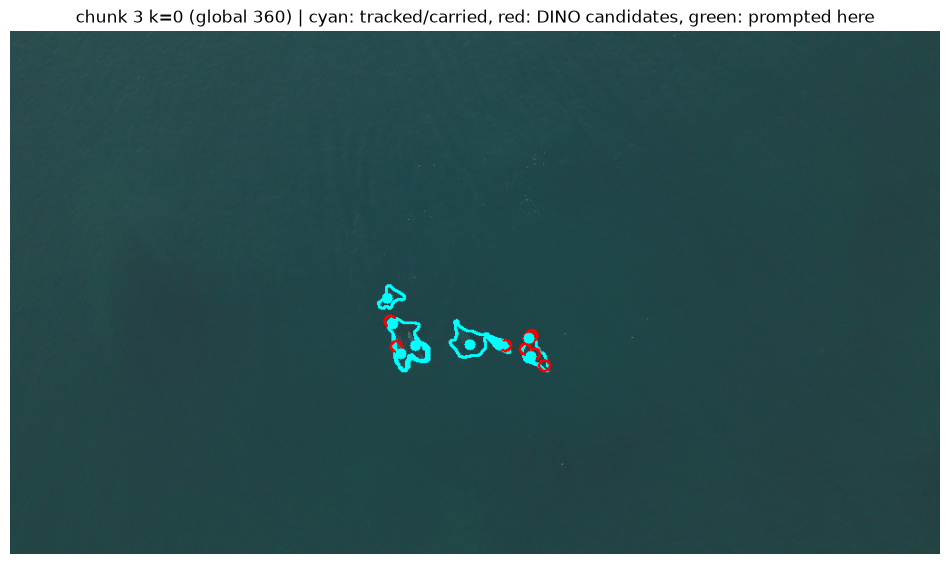

  0%|          | 0/30 [00:00<?, ?it/s]

INFO 2026-09-21 01:16:19,894 13896 sam3_base_predictor.py: 305: propagation ended in session 67e93869-d62e-4998-a343-e5a5e3b5be90


  0%|          | 0/85 [00:00<?, ?it/s]

INFO 2026-09-21 01:16:28,992 13896 sam3_base_predictor.py: 305: propagation ended in session 67e93869-d62e-4998-a343-e5a5e3b5be90


c3 k=  30 (global  390):  5 DINO candidates,  1 new,  1 prompted, 24 masklets, 115/115 frames | VRAM  8.55 GiB alloc, 13.55 GiB free


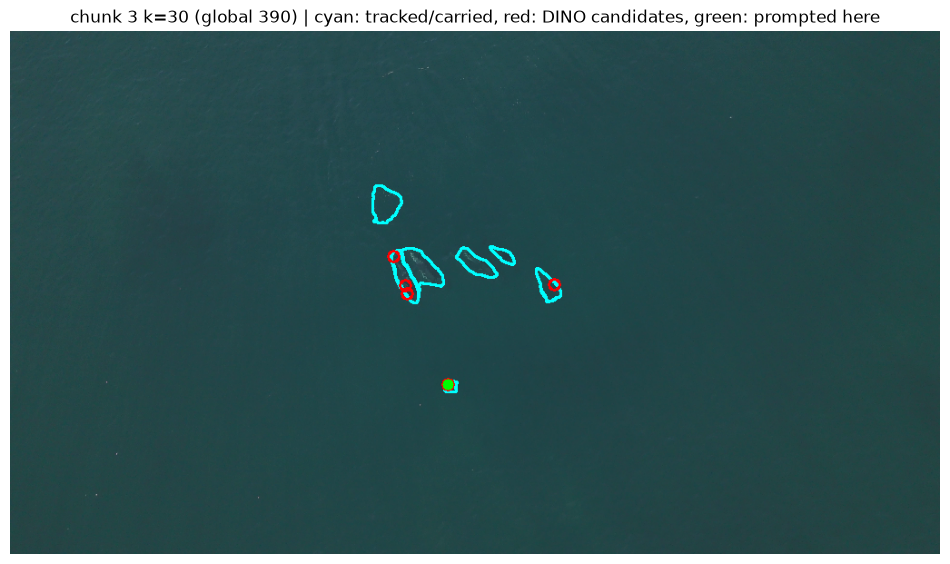

c3 k=  60 (global  420):  4 DINO candidates,  0 new,  0 prompted, 24 masklets, 115/115 frames | VRAM  8.55 GiB alloc, 13.55 GiB free


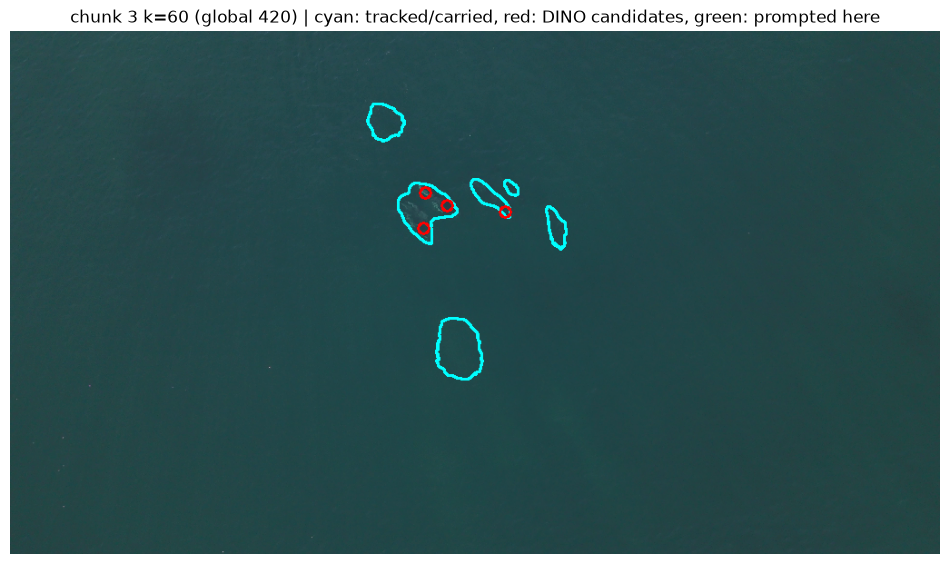

c3 k=  90 (global  450):  3 DINO candidates,  1 new,  0 prompted, 24 masklets, 115/115 frames | VRAM  8.55 GiB alloc, 13.55 GiB free


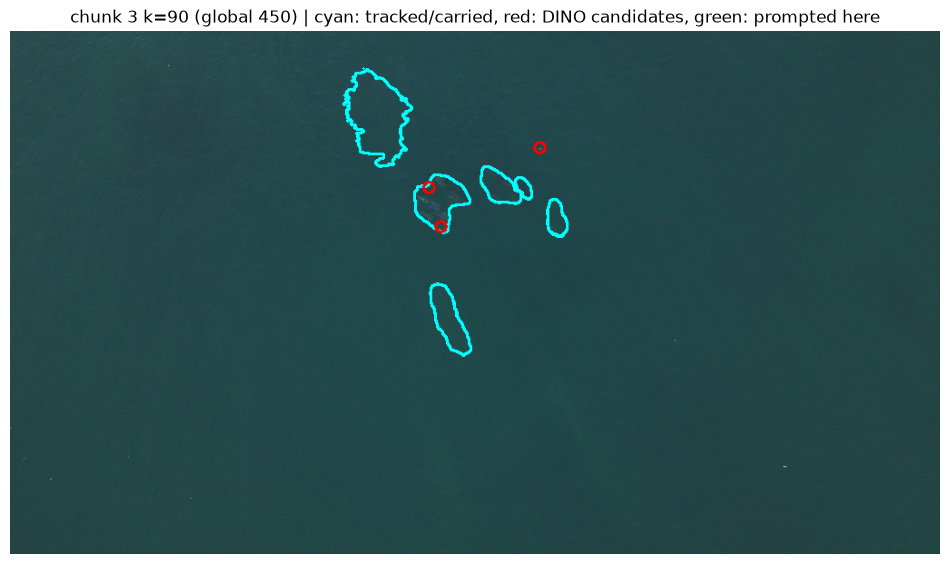

chunk 3 done: 8 carried, 115/115 frames covered, 24 masklets


INFO 2026-09-21 01:16:39,531 13896 sam3_base_predictor.py: 409: removed session 67e93869-d62e-4998-a343-e5a5e3b5be90


44 tracks (20 carried) from 98 candidates over 4 chunks; merged 475/475 frames


In [4]:
from sam3.model_builder import build_sam3_video_predictor
from sam3.visualization_utils import save_masklet_video

from fish_segmentation.sam3_utils import (
    add_point_prompt,
    carry_over_points,
    merge_chunk_outputs,
    object_mask_area,
    propagate_in_video,
    select_new_points,
)

predictor = build_sam3_video_predictor(gpus_to_use=range(torch.cuda.device_count()))

chunk_frame_outputs = []
chunk_summary = []
track_log = []
next_id = 0
n_candidates = 0
n_carried = 0

for chunk_index, ((start, end), chunk_path) in enumerate(zip(chunk_plan, chunk_paths)):
    chunk_len = end - start
    response = predictor.handle_request(
        request=dict(
            type="start_session",
            resource_path=str(chunk_path),
            offload_state_to_cpu=True,   # per-frame tracker state -> CPU RAM
            offload_video_to_cpu=True,   # frame batch intent (cv2 loader still moves it)
        )
    )
    session_id = response["session_id"]
    outputs_per_frame = {}
    carried = []

    # Carry the objects of the previous chunk into this session. The hand-over
    # frame is this chunk's global `start`, covered by the previous chunk (its
    # outputs key is local there: start - previous_start).
    if chunk_index > 0:
        previous_start, _ = chunk_plan[chunk_index - 1]
        for point in carry_over_points(
            chunk_frame_outputs[-1].get(start - previous_start), min_area=CARRY_MIN_AREA
        ):
            prompt_outputs = add_point_prompt(
                predictor,
                session_id,
                frame_index=0,
                points=[[point["x"], point["y"]]],
                obj_id=point["obj_id"],
            )
            if object_mask_area(prompt_outputs, point["obj_id"]) == 0:
                print(f"chunk {chunk_index}: carried obj {point['obj_id']} got an empty mask, dropped")
                continue
            outputs_per_frame[0] = prompt_outputs  # dedupe k=0 detections against carried masks
            carried.append(point)
            track_log.append(
                {
                    "obj_id": point["obj_id"],
                    "chunk": chunk_index,
                    "carried_from": chunk_index - 1,
                    "keyframe": start,
                    "x": point["x"],
                    "y": point["y"],
                    "area": point["area"],
                }
            )
    n_carried += len(carried)

    for k in range(0, chunk_len, KEYFRAME_STRIDE):
        global_k = start + k
        orig_index = int(round(global_k * orig_fps / SESSION_FPS))
        orig_index = min(max(orig_index, 0), orig_n_frames - 1)
        keyframe = load_frame_rgb(str(video_path), orig_index)
        if keyframe is None:
            print(f"c{chunk_index} k={k:4d}: original frame {orig_index} not readable, skipping")
            continue

        detections = run_zoom_detector(
            image=Image.fromarray(keyframe),
            model=model,
            processor=processor,
            long_side=DINO_LONG_SIDE,
            resolution_scale=DINO_RESOLUTION_SCALE,
            merge_gap=ZONE_MERGE_GAP,
            min_zone_fraction=MIN_ZONE_FRACTION,
            min_confirmations=MIN_CONFIRMATIONS,
        )
        new_points = select_new_points(
            detections,
            frame_outputs=outputs_per_frame.get(k),
            min_score=MIN_SCORE,
            min_solidity=MIN_SOLIDITY,
            min_area=MIN_AREA,
            mask_margin_px=MASK_MARGIN_PX,
            dedupe_overlap=DEDUPE_OVERLAP,
        )

        accepted = new_points[: max(0, MAX_OBJECTS - next_id)]
        for i, det in enumerate(accepted):
            add_point_prompt(
                predictor,
                session_id,
                frame_index=k,
                points=[[det["x"], det["y"]]],
                obj_id=next_id + i,
            )
            track_log.append(
                {
                    "obj_id": next_id + i,
                    "chunk": chunk_index,
                    "keyframe": global_k,
                    "x": det["x"],
                    "y": det["y"],
                    "radius": det["radius"],
                    "level": det["level"],
                    "n_levels": det["n_levels"],
                    "score_mean": det["score_mean"],
                    "solidity": det["solidity"],
                }
            )
        next_id += len(accepted)
        n_candidates += len(detections)

        # Propagate when there is something to track: new candidates and/or the
        # carried objects (the latter only at k=0, which otherwise would never
        # reach the end of the chunk when no new detection shows up).
        if accepted or (k == 0 and carried):
            if k > 0:
                outputs_per_frame.update(
                    propagate_in_video(
                        predictor,
                        session_id,
                        start_frame_index=k,
                        propagation_direction="backward",
                    )
                )
            outputs_per_frame.update(
                propagate_in_video(
                    predictor,
                    session_id,
                    start_frame_index=k,
                    propagation_direction="forward",
                )
            )

        free_bytes, _ = torch.cuda.mem_get_info()
        print(
            f"c{chunk_index} k={k:4d} (global {global_k:4d}): {len(detections):2d} DINO candidates, "
            f"{len(new_points):2d} new, {len(accepted):2d} prompted, {next_id:2d} masklets, "
            f"{len(outputs_per_frame):3d}/{chunk_len} frames | "
            f"VRAM {torch.cuda.memory_allocated() / 2**30:5.2f} GiB alloc, "
            f"{free_bytes / 2**30:5.2f} GiB free"
        )

        if SHOW_KEYFRAME_REVIEW:
            review = cv2.resize(keyframe, (1024, 576))  # 4K keyframe -> review image
            frame_out = outputs_per_frame.get(k)
            if frame_out is not None:
                for mask in frame_out["out_binary_masks"]:
                    contours, _ = cv2.findContours(
                        mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
                    )
                    cv2.drawContours(review, contours, -1, (0, 255, 255), 2)
            for det in detections:
                cx, cy = int(det["x"] * review.shape[1]), int(det["y"] * review.shape[0])
                cv2.circle(review, (cx, cy), 6, (255, 0, 0), 2)
            for det in accepted:
                cx, cy = int(det["x"] * review.shape[1]), int(det["y"] * review.shape[0])
                cv2.circle(review, (cx, cy), 6, (0, 255, 0), -1)
            if k == 0:
                for point in carried:
                    cx = int(point["x"] * review.shape[1])
                    cy = int(point["y"] * review.shape[0])
                    cv2.circle(review, (cx, cy), 6, (0, 255, 255), -1)
            fig, ax = plt.subplots(1, 1, figsize=(12, 7))
            ax.imshow(review)
            ax.set_title(
                f"chunk {chunk_index} k={k} (global {global_k}) | cyan: tracked/carried, "
                "red: DINO candidates, green: prompted here"
            )
            ax.axis("off")
            plt.show()

    chunk_frame_outputs.append(outputs_per_frame)
    chunk_summary.append(
        {
            "index": chunk_index,
            "start": start,
            "end": end,
            "carried": len(carried),
            "frames_covered": len(outputs_per_frame),
            "masklets_after": next_id,
        }
    )
    print(
        f"chunk {chunk_index} done: {len(carried)} carried, "
        f"{len(outputs_per_frame)}/{chunk_len} frames covered, {next_id} masklets"
    )
    predictor.handle_request(request=dict(type="close_session", session_id=session_id))
    torch.cuda.empty_cache()

merged_outputs = merge_chunk_outputs(chunk_frame_outputs, chunk_plan)
print(
    f"{len(track_log)} tracks ({n_carried} carried) from {n_candidates} candidates over "
    f"{len(chunk_plan)} chunks; merged {len(merged_outputs)}/{n_frames} frames"
)

## 3. Merge and export

`merge_chunk_outputs` keys everything by GLOBAL frame index (each overlapped
frame comes from the newest chunk that produced outputs for it) and the ids are
already global, so the masklet video and the JSON are a single continuous
result — no video concatenation needed.

In [5]:
out_stem = f"dino_sam_chunked_{video_path.parent.name}_{video_path.stem}"
track_video_path = OUTPUTS / f"{out_stem}.mp4"
track_log_path = OUTPUTS / f"{out_stem}_tracks.json"
chunk_summary_path = OUTPUTS / f"{out_stem}_chunks.json"

if merged_outputs:
    proxy_frames = load_all_frames_rgb(str(sam3_video_path))
    save_masklet_video(
        video_frames=proxy_frames,
        outputs=merged_outputs,
        out_path=str(track_video_path),
        alpha=0.5,
        fps=15,
    )
    with open(track_log_path, "w") as f:
        json.dump(track_log, f, indent=2)
    with open(chunk_summary_path, "w") as f:
        json.dump(
            {
                "chunk_frames": CHUNK_FRAMES,
                "overlap_frames": OVERLAP_FRAMES,
                "keyframe_stride": KEYFRAME_STRIDE,
                "session_fps": SESSION_FPS,
                "n_frames": n_frames,
                "chunks": chunk_summary,
                "tracks": len(track_log),
                "carried": n_carried,
            },
            f,
            indent=2,
        )
    print(track_video_path)
    print(track_log_path)
    print(chunk_summary_path)
else:
    print("No tracks were prompted; nothing to render.")

  0%|          | 0/475 [00:00<?, ?it/s]

  1%|          | 4/475 [00:00<00:11, 39.61it/s]

  2%|▏         | 10/475 [00:00<00:09, 46.73it/s]

  3%|▎         | 15/475 [00:00<00:09, 48.02it/s]

  4%|▍         | 21/475 [00:00<00:09, 49.36it/s]

  6%|▌         | 27/475 [00:00<00:08, 50.04it/s]

  7%|▋         | 33/475 [00:00<00:08, 52.64it/s]

  8%|▊         | 40/475 [00:00<00:07, 56.84it/s]

 10%|▉         | 47/475 [00:00<00:07, 59.18it/s]

 11%|█▏        | 54/475 [00:00<00:06, 60.30it/s]

 13%|█▎        | 61/475 [00:01<00:06, 60.46it/s]

 14%|█▍        | 68/475 [00:01<00:06, 60.77it/s]

 16%|█▌        | 75/475 [00:01<00:06, 61.61it/s]

 17%|█▋        | 82/475 [00:01<00:06, 62.84it/s]

 19%|█▊        | 89/475 [00:01<00:06, 63.29it/s]

 20%|██        | 96/475 [00:01<00:05, 63.49it/s]

 22%|██▏       | 103/475 [00:01<00:05, 63.97it/s]

 23%|██▎       | 110/475 [00:01<00:05, 64.70it/s]

 25%|██▍       | 118/475 [00:01<00:05, 67.06it/s]

 27%|██▋       | 126/475 [00:02<00:05, 69.14it/s]

 28%|██▊       | 134/475 [00:02<00:04, 71.68it/s]

 30%|██▉       | 142/475 [00:02<00:04, 73.56it/s]

 32%|███▏      | 150/475 [00:02<00:04, 74.77it/s]

 33%|███▎      | 158/475 [00:02<00:04, 74.81it/s]

 35%|███▍      | 166/475 [00:02<00:04, 75.44it/s]

 37%|███▋      | 174/475 [00:02<00:03, 75.56it/s]

 39%|███▊      | 183/475 [00:02<00:03, 77.01it/s]

 40%|████      | 192/475 [00:02<00:03, 78.55it/s]

 42%|████▏     | 201/475 [00:03<00:03, 80.76it/s]

 44%|████▍     | 210/475 [00:03<00:03, 80.76it/s]

 46%|████▌     | 219/475 [00:03<00:03, 80.38it/s]

 48%|████▊     | 228/475 [00:03<00:03, 80.72it/s]

 50%|████▉     | 237/475 [00:03<00:02, 81.20it/s]

 52%|█████▏    | 246/475 [00:03<00:02, 77.50it/s]

 53%|█████▎    | 254/475 [00:03<00:03, 73.47it/s]

 55%|█████▌    | 262/475 [00:03<00:03, 70.77it/s]

 57%|█████▋    | 270/475 [00:03<00:02, 69.07it/s]

 58%|█████▊    | 277/475 [00:04<00:02, 68.13it/s]

 60%|█████▉    | 284/475 [00:04<00:02, 67.19it/s]

 61%|██████▏   | 291/475 [00:04<00:02, 67.31it/s]

 63%|██████▎   | 298/475 [00:04<00:02, 66.87it/s]

 64%|██████▍   | 305/475 [00:04<00:02, 67.53it/s]

 66%|██████▌   | 313/475 [00:04<00:02, 68.83it/s]

 67%|██████▋   | 320/475 [00:04<00:02, 67.72it/s]

 69%|██████▉   | 327/475 [00:04<00:02, 67.47it/s]

 70%|███████   | 334/475 [00:04<00:02, 68.08it/s]

 72%|███████▏  | 341/475 [00:05<00:02, 66.82it/s]

 73%|███████▎  | 348/475 [00:05<00:01, 65.98it/s]

 75%|███████▍  | 355/475 [00:05<00:01, 65.38it/s]

 76%|███████▋  | 363/475 [00:05<00:01, 67.42it/s]

 78%|███████▊  | 371/475 [00:05<00:01, 70.38it/s]

 80%|███████▉  | 379/475 [00:05<00:01, 72.96it/s]

 82%|████████▏ | 388/475 [00:05<00:01, 75.87it/s]

 83%|████████▎ | 396/475 [00:05<00:01, 76.52it/s]

 85%|████████▌ | 404/475 [00:05<00:00, 77.11it/s]

 87%|████████▋ | 412/475 [00:05<00:00, 77.35it/s]

 88%|████████▊ | 420/475 [00:06<00:00, 77.85it/s]

 90%|█████████ | 428/475 [00:06<00:00, 78.24it/s]

 92%|█████████▏| 436/475 [00:06<00:00, 78.36it/s]

 93%|█████████▎| 444/475 [00:06<00:00, 77.97it/s]

 95%|█████████▌| 452/475 [00:06<00:00, 77.57it/s]

 97%|█████████▋| 461/475 [00:06<00:00, 78.33it/s]

 99%|█████████▉| 470/475 [00:06<00:00, 79.03it/s]

100%|██████████| 475/475 [00:06<00:00, 70.04it/s]

ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Input #0, mov,mp4,m4a,3gp,3g2,mj2, from 'temp.mp4':
  Metadata:
    major_brand     : isom
    minor_version   : 512
    compatible_brands: isomiso2mp41
    encoder         : Lavf59.27.100
  Duration: 00:00:31.67, start: 0.000000, bitrate: 1299 kb/s
  Stream #0:0[0x1](und): Video: mpeg4 (Simple Profile) (mp4v / 0x7634706D), yuv420p, 1024x576 [SAR 1:1 DAR 16:9], 1298 kb/s, 15 fps, 15 tbr, 15360 tbn (default)
    Metadata:
      handler_name    : VideoHandler
      vendor_id       : [0][0][0][0]
Stream mapping:
  Stream #0:0 -> #0:0 (mpeg4 (native) -> h264 (libx264))
Press [q] to stop, [?] for help
[libx264 @ 0x5faa93ab9200] using SAR=1/1
[libx264 @ 0x5faa93ab9200] using cpu capabilities: MMX2 SSE2Fast SSSE3 SSE4.2 AVX FMA3 BMI2 AVX2
[libx264 @ 0x5faa93ab9200] profile High, level 3.1, 4:2:0, 8-bit
[libx264 @ 0x5faa93ab9200] 264 - core 164 r3108 31e19f9 - H.264/MPEG-4 AVC codec - Copyleft 2003-2023 - http://www.videolan.org/x264.html - options: cabac=1 ref=3 deblock=1:0:0 analyse=0x3:0x11

Re-encoded video saved to /workspace/fish-segmentation/notebooks/outputs/dino_sam_chunked_20260813_213529_7f994a2f_video.mp4
/workspace/fish-segmentation/notebooks/outputs/dino_sam_chunked_20260813_213529_7f994a2f_video.mp4
/workspace/fish-segmentation/notebooks/outputs/dino_sam_chunked_20260813_213529_7f994a2f_video_tracks.json
/workspace/fish-segmentation/notebooks/outputs/dino_sam_chunked_20260813_213529_7f994a2f_video_chunks.json


[out#0/mp4 @ 0x5faa93ab78c0] video:2359kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.271792%
frame=  475 fps=225 q=-1.0 Lsize=    2365kB time=00:00:31.46 bitrate= 615.8kbits/s speed=14.9x    
[libx264 @ 0x5faa93ab9200] frame I:2     Avg QP:13.37  size: 13378
[libx264 @ 0x5faa93ab9200] frame P:123   Avg QP:15.36  size:  7963
[libx264 @ 0x5faa93ab9200] frame B:350   Avg QP:16.72  size:  4025
[libx264 @ 0x5faa93ab9200] consecutive B-frames:  1.1%  0.8%  3.8% 94.3%
[libx264 @ 0x5faa93ab9200] mb I  I16..4: 44.3% 52.4%  3.2%
[libx264 @ 0x5faa93ab9200] mb P  I16..4:  7.7% 33.6%  0.9%  P16..4: 24.5%  6.3%  4.5%  0.0%  0.0%    skip:22.4%
[libx264 @ 0x5faa93ab9200] mb B  I16..4:  0.8%  2.5%  0.2%  B16..8: 36.3%  5.3%  0.8%  direct: 6.9%  skip:47.3%  L0:58.0% L1:40.5% BI: 1.5%
[libx264 @ 0x5faa93ab9200] 8x8 transform intra:77.6% inter:75.6%
[libx264 @ 0x5faa93ab9200] coded y,uvDC,uvAC intra: 14.7% 27.8% 4.9% inter: 4.0% 16.4% 2.9%
[libx264 @ 0x5faa93ab9200] i16

In [6]:
from IPython.display import Video

if track_video_path.exists():
    # relative src so JupyterLab serves it from notebooks/outputs without embedding it
    Video(f"outputs/{track_video_path.name}", embed=False, width=640)
else:
    print("No overlay video was written.")

In [7]:
!nvidia-smi

Mon Sep 21 01:16:49 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.126.09             Driver Version: 580.126.09     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4090        On  |   00000000:81:00.0 Off |                  Off |
| 31%   50C    P2             56W /  450W |    7148MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----